<a href="https://colab.research.google.com/github/coffeepluschris/strawberry/blob/main/pytorch1_8_detectron2_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron2 and Dependencies

In [1]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [2]:
# Install torch 1.8 for detectron2 ( if colab  changes versions)

!pip install torch==1.8.1+cu101 torchvision==0.9.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.7 MB 10 kB/s 
     |████████████████████████████████| 17.3 MB 81 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.8.1+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.8.1+cu101 which is incompatible.


In [3]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.8.1+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [4]:
torch.__version__

'1.8.1+cu101'

In [5]:
torchvision.__version__

'0.9.1+cu101'

In [6]:
# # install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.8")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 44.9 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 130 kB 32.1 MB/s 
     |████████████████████████████████| 49 kB 6.3 MB/s 
     |████████████████████████████████| 145 kB 44.2 MB/s 
     |████████████████████████████████| 749 kB 46.3 MB/s 
     |████████████████████████████████| 843 kB 50.0 MB/s 
     |████████████████████████████████| 112 kB 47.7 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=8c4d9061a2719c67b357bcee39b511d0e030ec4ccdc5654c5f0bd3a43c59d81f
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=3302ad261516b94317a8a317fee5bb9160d8d9b7114af0f5a6bd6bcbffc81

In [7]:
# Make sure compatible pillow version
!pip install pillow==7.2
# %reload_ext autoreload
# %autoreload

     |████████████████████████████████| 2.2 MB 12.6 MB/s 
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [8]:
# Some basic setup:
# Import detectron2 & common detectron2 utilities
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# import some common libraries
import numpy as np
#import os, json, cv2, random
import json, cv2, random
from google.colab.patches import cv2_imshow

import tqdm
import time

# Creating a Dataset

[Sign Up](http://sixgill.tech/ai-powered-labeling) for Sense Data Annotation. No card required.

Labeled with [Sense Data Annotation](https://sixgill.com/platform/sense-data-annotation/) and exported in the COCO format.

Read Sense Data Annotation docs [here](https://docs.sixgill.com/).

Give me any feedback / ask questions on [slack](https://sixgill.tech/slack)

![Labeling for object detection](https://gblobscdn.gitbook.com/assets%2F-MJxxV6sKASlEjxiEwc2%2F-MKrhpy2wLI2lxD79AhV%2F-MKrinYxj-fQSlHaP6jB%2FSmartPoly_2cows.gif?alt=media&token=667d94a8-2493-4e5c-846c-0bae50480ba4)




# Download our already labeled Dataset

For this project we're going to use my "famous" synthetic goose dataset. Read more about how and why that was created here: https://github.com/sagecodes/make-a-wildlife-object-detector

In [9]:
# download dataset from github
!git clone https://github.com/sagecodes/geese-object-detection-dataset.git
#!git clone https://github.com/coffeepluschris/cards.git

Cloning into 'geese-object-detection-dataset'...
remote: Enumerating objects: 143, done.
remote: Total 143 (delta 0), reused 0 (delta 0), pack-reused 143
Receiving objects: 100% (143/143), 47.74 MiB | 33.03 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [10]:
!ls geese-object-detection-dataset
#!ls cards/testCards-project-1638406479

img  test.json	train.json  validation.json


In [11]:
!ls geese-object-detection-dataset/img
#!ls cards/testCards-project-1638406479/img

01ES4X7MA9JNHWE5R2H9SS5K9D.jpeg  01ES4X81ZSAXMYCECH3EJDSKS7.jpeg
01ES4X7MCDS6BJ5SX59NCWN6QF.jpeg  01ES4X82EHY5M7YA0QTA1VEEBP.jpeg
01ES4X7MCQ19DY45HHJZ144A7M.jpeg  01ES4X82GQ0Z05FB96YRGFHMSY.jpeg
01ES4X7MTZ56RXAG2KQ7XSC73C.jpeg  01ES4X82HBA2D7TWR8A6R76F23.jpeg
01ES4X7MXGF0KKHDKC3JQQGH68.jpeg  01ES4X83377S4HWRJZNWKVR7BP.jpeg
01ES4X7N4N9WSS4AKMX00T3SAZ.png	 01ES4X833CB77HM25N8MJHCSX5.png
01ES4X7NC5XDZSMSA20QP99FXD.jpeg  01ES4X834M4SBG4DZAZ7H7KF3Z.jpeg
01ES4X7NF0X4ZBGSBKV1JQX7RD.jpeg  01ES4X83QQK5TCE58C1J4NB4HZ.jpeg
01ES4X7NPECCX2BQ5E3RJK2062.jpeg  01ES4X83S7HWVYEEXE3HAT0CE7.png
01ES4X7NYB60VDQ2A10X876BND.png	 01ES4X842MBFEVA603YY6CY6AY.png
01ES4X7P0RFY4G2V8WT6C0KRPC.png	 01ES4X849JW3J7BFGVA94672MQ.jpeg
01ES4X7P72M5GRRMD5JYSCGAQ5.jpeg  01ES4X84CCSKMEPKV8528PEDEC.jpeg
01ES4X7PJ36BF8CPZN2Q1HS617.png	 01ES4X84JP6P10Q32ZZ1JWW3FR.jpeg
01ES4X7PKZ8HSAB179VBQ5P9DR.jpeg  01ES4X84SF67H400XDR00WKB75.jpeg
01ES4X7PRWPHA2N4DE5N9CW8RQ.jpeg  01ES4X84XXH5VVZ4QXK67AQ57F.jpeg
01ES4X7Q3WA3GKFTRPY38KAD46.jpeg 

## Import a Dataset

### Setup COCO dataset for detectron2

[Detectron2 dataset docs](https://detectron2.readthedocs.io/tutorials/datasets.html)

[COCO](https://cocodataset.org/#home) is a popular dataset and computer vision dataset format




For this workshop we're using git clone, but for your own data you can use a couple other ways

- directly upload to colab instance
- mount to google drive <-- strongly encouraged for long term projects 

<-- You can easily to do both from the side bar

or you can mount with a code cell
```
drive.mount('/content/gdrive')
```




In [12]:
# import COCO format datasets
from detectron2.data.datasets import register_coco_instances
register_coco_instances("geese_train", {}, "/content/geese-object-detection-dataset/train.json", "/content/geese-object-detection-dataset")
register_coco_instances("geese_val", {}, "/content/geese-object-detection-dataset/validation.json", "/content/geese-object-detection-dataset")

# bonus labled dataset for getting more metrics on our model
register_coco_instances("geese_test", {}, "/content/geese-object-detection-dataset/test.json", "/content/geese-object-detection-dataset")


[12/06 00:44:23 d2.data.datasets.coco]: Loaded 110 images in COCO format from /content/geese-object-detection-dataset/train.json


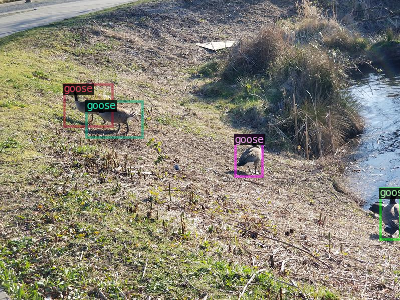

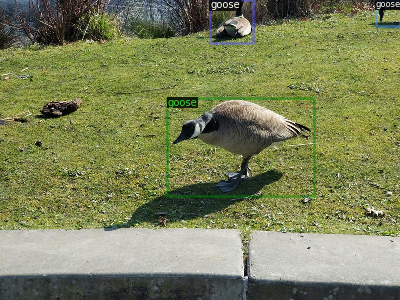

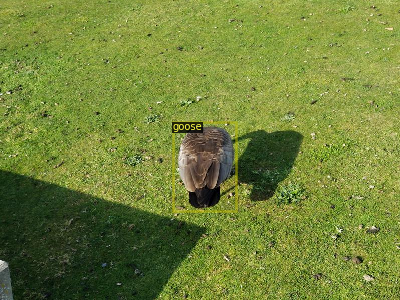

In [13]:
# check dataset is reading correctly
my_dataset_train_metadata = MetadataCatalog.get("geese_train")

dataset_dicts = DatasetCatalog.get("geese_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# set meta data for validation set (we'll usue this later for testing)
test_metadata = MetadataCatalog.get("geese_test")

You can learn more about this dataset [here](https://github.com/sagecodes/make-a-wildlife-object-detector)

In [14]:
# Let look at what our dataset looks like after loading in
dataset_dicts

[{'annotations': [{'bbox': [220.25334781035104,
     16.745900827329237,
     237.19145855953673,
     536.8626266147905],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0}],
  'file_name': '/content/geese-object-detection-dataset/img/01ES4X83S7HWVYEEXE3HAT0CE7.png',
  'height': 600,
  'image_id': 1,
  'width': 800},
 {'annotations': [{'bbox': [21.512848353239207,
     15.356265037989836,
     58.83460007238508,
     122.7511613916475],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0},
   {'bbox': [272.60224393774877,
     69.55206082222668,
     194.57111834961998,
     138.5003670041608],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0},
   {'bbox': [84.98009410061525,
     263.1746474701839,
     231.16901918204854,
     183.89513612258133],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0},
   {'bbox': [418.9938472674629,
     347.016006760328,
     287.22403184

# Training a Detectron2 Model for Object Detection 

Setup Validation class

https://medium.com/@apofeniaco/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

In [15]:
# Create class for doing validation during training
# Read more about this above: 

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR,"inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)


https://detectron2.readthedocs.io/tutorials/configs.html

model zoo: https://github.com/facebookresearch/Detectron/blob/master/MODEL_ZOO.md


**Some model types to try**

- Instance Segmentation: `COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml`
- Object Detection: `COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml` 


The warning: `Skip loading parameter 'roi_heads.box_predictor.cls_score.weight to the model due to incompatible shapes` is OK. It's because we have different number of classes than what the weights were trained on (81 clasess)

In [16]:
from detectron2.engine import DefaultTrainer

# initialize Detectron2 Training configuration
cfg = get_cfg()
# Select Model from Model Zoo 
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# Let training initialize from pretrained model zoo weights (transfer learning!)
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
# Select how many classes you're training to detect
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# Pass in training dataset (don't forget comma at end)
cfg.DATASETS.TRAIN = ("geese_train",)
# Number of iteration to learn from our dataset
cfg.SOLVER.MAX_ITER = 300
# Learning Rate (think: how your network adjusts weights)
cfg.SOLVER.BASE_LR = 0.001
# Can adjust for Multi processes loading
cfg.DATALOADER.NUM_WORKERS = 0
# Images per batch per GPU
cfg.SOLVER.IMS_PER_BATCH = 2
# Number of instances per btach
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32

# Create output directory for training
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Load validation dataset
cfg.DATASETS.TEST = ("geese_val",)
# number of iteration before validation
cfg.TEST.EVAL_PERIOD = 50

trainer = MyTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/06 00:44:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:39, 10.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[12/06 00:45:13 d2.engine.train_loop]: Starting training from iteration 0
[12/06 00:46:52 d2.utils.events]:  eta: 0:22:55  iter: 19  total_loss: 1.603  loss_cls: 0.6824  loss_box_reg: 0.9629  loss_rpn_cls: 0.001875  loss_rpn_loc: 0.005081  time: 4.9368  data_time: 0.0744  lr: 6.427e-05  max_mem: 5296M
[12/06 00:48:33 d2.utils.events]:  eta: 0:21:21  iter: 39  total_loss: 1.376  loss_cls: 0.435  loss_box_reg: 0.9333  loss_rpn_cls: 0.002722  loss_rpn_loc: 0.005567  time: 4.9821  data_time: 0.0750  lr: 0.00013087  max_mem: 5296M
[12/06 00:49:22 d2.data.datasets.coco]: Loaded 14 images in COCO format from /content/geese-object-detection-dataset/validation.json
[12/06 00:49:22 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   goose    | 37           |
|            |              |
[12/06 00:49:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800,

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Use a Trained Model

In [18]:
!ls ./output/

events.out.tfevents.1638751473.88a5308d3eb8.149.0  metrics.json
inference					   model_final.pth
last_checkpoint


In [19]:
# Initialize config
cfg = get_cfg()
# Must be same as model trained in.
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# Path to saved model weights (trained model)
cfg.MODEL.WEIGHTS = '/content/output/model_final.pth'
# if using datasets for metadata
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# Threshhold to show predictions
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
# create predictor instance to use
predictor = DefaultPredictor(cfg)

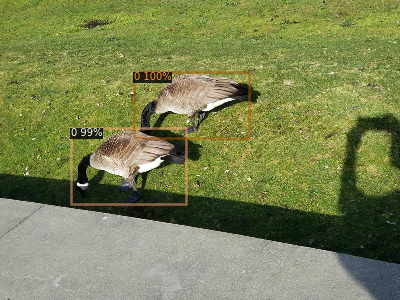

In [20]:
# Run test on an image
# from detectron2.utils.visualizer import ColorMode
test_image_path = '/content/geese-object-detection-dataset/img/01ES4X7WSQF4XAGHFFACJSPN4Q.jpeg'
im = cv2.imread(test_image_path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5
    )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [21]:
# What does an image look like to the computer?
print(im)

[[[ 44 141 131]
  [ 43 140 130]
  [ 47 144 134]
  ...
  [ 62 141 127]
  [ 74 149 133]
  [ 74 149 133]]

 [[ 49 145 135]
  [ 47 143 133]
  [ 49 145 135]
  ...
  [ 58 135 121]
  [ 62 137 123]
  [ 68 143 129]]

 [[ 58 151 142]
  [ 55 148 139]
  [ 55 148 139]
  ...
  [ 66 142 130]
  [ 64 138 126]
  [ 76 150 138]]

 ...

 [[160 167 170]
  [156 163 166]
  [154 162 162]
  ...
  [ 85  71  59]
  [ 89  75  63]
  [ 93  79  67]]

 [[163 170 173]
  [157 164 167]
  [154 162 162]
  ...
  [ 78  65  51]
  [ 81  68  54]
  [ 84  71  57]]

 [[171 178 181]
  [163 170 173]
  [158 166 166]
  ...
  [ 89  76  62]
  [ 85  72  58]
  [ 83  70  56]]]


In [22]:
#What does the model output look like not drawn on an image?
print(outputs["instances"].to("cpu"))

Instances(num_instances=2, image_height=600, image_width=800, fields=[pred_boxes: Boxes(tensor([[267.8189, 144.6486, 498.0596, 275.7165],
        [141.5659, 256.8233, 372.1044, 408.8442]])), scores: tensor([0.9972, 0.9932]), pred_classes: tensor([0, 0])])


In [23]:
# Count objects detected in an image
object_count = outputs["instances"].to("cpu")
print("Detected "+str(len(object_count))+" Geese")

Detected 2 Geese


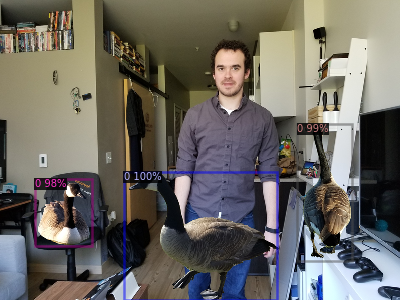

In [24]:
# Run test on an image
# from detectron2.utils.visualizer import ColorMode
test_image_path = '/content/geese-object-detection-dataset/img/01ES4X8G607FY4FP9FV0E3WNNA.png'
im = cv2.imread(test_image_path)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.5
    )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

### Evaluation metrics

Here is great post that will go deeper into object detection evaluations metrics:

https://cocodataset.org/#detection-eval 

https://www.pyimagesearch.com/2018/05/14/a-gentle-guide-to-deep-learning-object-detection/

Detectron2 has built evaluation methods 

In [25]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("geese_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "geese_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [12/06 01:11:22 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/06 01:11:22 d2.data.datasets.coco]: Loaded 13 images in COCO format from /content/geese-object-detection-dataset/test.json
[12/06 01:11:22 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   goose    | 32           |
|            |              |
[12/06 01:11:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/06 01:11:22 d2.data.common]: Serializing 13 elements to byte tensors and concatenating them all ...
[12/06 01:11:22 d2.data.common]: Serialized dataset takes 0.00 MiB
[12/06 01:11:22 d2.evaluation.evaluator]: Start inference on 13 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[12/06 01:11:31 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0010 s/iter. Inference: 0.7741 s/iter. Eval: 0.0003 s/iter. Total: 0.7754 s/iter. ETA=0:00:01
[12/06 01:11:32 d2.evaluation.evaluator]: Total inference time: 0:00:06.321416 (0.790177 s / iter per device, on 1 devices)
[12/06 01:11:32 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:06 (0.774499 s / iter per device, on 1 devices)
[12/06 01:11:32 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/06 01:11:32 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[12/06 01:11:32 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/06 01:11:32 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/06 01:11:32 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/06 01:11:32 d2.evaluation.

# Run detection on a video

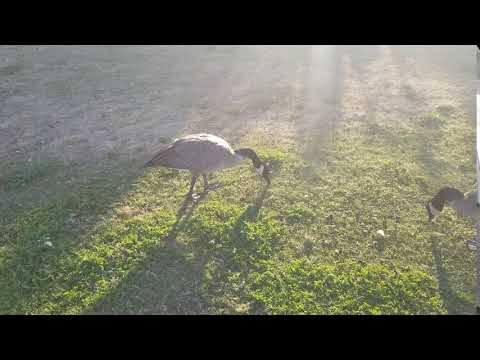

In [26]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("6vmlPXkkQ4Y", width=500)
display(video)

In [27]:
# Install dependencies, to download video, and crop for processing 
# Can skip if you are uploading your own video from google drive
!pip install youtube-dl
# !pip uninstall -y opencv-python-headless opencv-contrib-python
# !apt install python3-opencv  # the one pre-installed have some issues

In [28]:
# Download video from youtube
!youtube-dl https://www.youtube.com/watch?v=6vmlPXkkQ4Y -f 22 -o video.mp4

[youtube] 6vmlPXkkQ4Y: Downloading webpage
[youtube] 6vmlPXkkQ4Y: Downloading MPD manifest
[download] video.mp4 has already been downloaded
[download] 100% of 4.07MiB


In [29]:
# (optional) create clip from video. Useful for large videos
!ffmpeg -i /content/video.mp4 -t 00:00:06 -c:v copy video-clip.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [30]:
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode#, Visualizer

# Extract video properties
video = cv2.VideoCapture('/content/video.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
video_writer = cv2.VideoWriter('out1.mp4',
                               fourcc=cv2.VideoWriter_fourcc(*"mp4v"),
                               fps=float(frames_per_second),
                               frameSize=(width, height),
                               isColor=True)

# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get(cfg.DATASETS.TEST[0]),
                                        ColorMode.IMAGE)

def run_model_on_video(video, maxFrames):
    """ 
    Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame,
                                                    outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(),
                                     cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Enumerate the frames of the video
for visualization in tqdm.tqdm(run_model_on_video(video, num_frames),
                               total=num_frames):

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()

100%|██████████| 307/307 [04:53<00:00,  1.05it/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [31]:
# Download the results
from google.colab import files
files.download('out1.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[Certification Form](https://docs.google.com/forms/d/e/1FAIpQLScIcKAGrF6JAZZJmNifuSRidJ3H51UkKQwVUu1IXCE58QXceQ/viewform)

# Keep Learning!

We just scratched the surface of the computer vision field, but I hope you feel confidant and inspired to learn more about it and creat your own projects! 

[Sign up for Sense Data Annotation](https://bit.ly/plainsight-data-annotation) & Start Labeling your own datasets! Retrain this notebook with them.

[Join me in slack](https://bit.ly/30lO9Cq) to ask any questions.

Follow Sixgill on [Medium](https://medium.com/sixgill) for Computer Vision Tutorials

Subscribe on [youtube](https://www.youtube.com/channel/UCWt--5NcY-O9PhjfPSDotew) for more content around computer vision.

Read/watch [my talk](https://github.com/sagecodes/make-a-wildlife-object-detector) on how to think about data and create sythetic data to improve your models.


### Learn more about different object detection methods:


- Single Shot MultiBox Detector (SSD) [explained](https://towardsdatascience.com/understanding-ssd-multibox-real-time-object-detection-in-deep-learning-495ef744fab) | [paper](https://arxiv.org/abs/1512.02325)

- You Only Look Once (YOLO) [Explained](https://medium.com/@jonathan_hui/real-time-object-detection-with-yolo-yolov2-28b1b93e2088) | [Paper](https://arxiv.org/abs/1506.02640) 

- Mask R-CNN [Explained](https://medium.com/@jonathan_hui/image-segmentation-with-mask-r-cnn-ebe6d793272) | [Paper](https://arxiv.org/abs/1703.06870)

- Detectron2 [github](https://github.com/facebookresearch/detectron2) | [official coloab](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5)

[Pyimagesearch](https://www.pyimagesearch.com/category/object-detection/) and [Machine Learning Mastery](https://machinelearningmastery.com/) are a great resources to take a look at. 


-------------------

#### Raw Links for chat:
https://bit.ly/plainsight-data-annotation

https://www.linkedin.com/in/sageelliott/

https://twitter.com/sagecodes

https://github.com/sagecodes

https://medium.com/sixgill

https://github.com/sagecodes/make-a-wildlife-object-detector

http://sixgill.tech/slack

https://docs.google.com/forms/d/e/1FAIpQLScIcKAGrF6JAZZJmNifuSRidJ3H51UkKQwVUu1IXCE58QXceQ/viewform
